# Figure 1 - Per tissue plots and markers

In [1]:
import os
from pathlib import Path
import pickle

import scanpy as sc
import anndata

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import plotnine as p9

from tqdm.auto import tqdm
from sklearn.metrics import adjusted_rand_score

import scvelo as scv
from io import StringIO

In [2]:
sc.set_figure_params(dpi=100)
plt.rcParams['pdf.fonttype'] = 42
sc.settings.figdir = 'figures/supplement-pertissue'

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import sys

sys.path.append(str(Path.home() / 'Code/sctoolkit/'))

In [5]:
from sctoolkit.proportions import plot_proportion_barplot, plot_proportion_barplot_cellcounts, plot_proportion_barplot_single_categorical, plot_proportion_barplot_with_ncells, merge_ggplots, dirichletreg, get_proportions_per_channel
from sctoolkit.utils import plot_significance_dotplot, run_spring, dotplot_spring
from sctoolkit.sctransform import sctransform

In [6]:
# from https://github.com/theislab/scanpy/issues/1513#issuecomment-735051689 Thanks to ivirshup

from adjustText import adjust_text
import matplotlib.patheffects as p

def gen_mpl_labels(
    adata, groupby, exclude=(), ax=None, adjust_kwargs=None, text_kwargs=None, basis='umap',
):
    if adjust_kwargs is None:
        adjust_kwargs = {"text_from_points": False}
    if text_kwargs is None:
        text_kwargs = {}

    medians = {}

    for g, g_idx in adata.obs.groupby(groupby).groups.items():
        if g in exclude:
            continue
        medians[g] = np.median(adata[g_idx].obsm[f"X_{basis}"], axis=0)

    if ax is None:
        texts = [
            plt.text(x=x, y=y, s=k, **text_kwargs) for k, (x, y) in medians.items()
        ]
    else:
        texts = [ax.text(x=x, y=y, s=k, **text_kwargs) for k, (x, y) in medians.items()]

    adjust_text(texts, **adjust_kwargs)

def umap_adj_text(adata, color, basis='umap', size=5, figure_size=(12,12), **kwds):

    with plt.rc_context({"figure.figsize": figure_size, "figure.dpi": 300, "figure.frameon": False}):
        ax = sc.pl.embedding(adata, basis=basis, color=color, show=False, legend_loc=None, frameon=False, size=size, **kwds)
        pe = [p.withStroke(linewidth=4, foreground='w')]
        gen_mpl_labels(
            adata,
            color,
            exclude=("None",),  # This was before we had the `nan` behaviour
            ax=ax,
            adjust_kwargs=dict(arrowprops=dict(arrowstyle='-', color='black')),
            text_kwargs=dict(fontsize=8, path_effects=pe, fontweight='bold'),
            basis=basis,
        )
        fig = ax.get_figure()
        fig.tight_layout()
        #plt.show()

    return fig

## Read data

In [7]:
adata = sc.read('../alltissue_v5__myocytes_20210204.h5ad')
adata

AnnData object with n_obs × n_vars = 209126 × 17695
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'Participant ID', 'Container', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Age', 'BMI', 'Race/Ethnicity', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'batch_triplet', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'batch-barcode', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'Tissue', 'channel', 'ischemic_time', 'Participant_ID', 'Sample_ID'
    var: 'gene_ids', 'Chromosome', 'Source', 'Start', 'End', '

In [8]:
adata.uns['Granular cell type_colors'] = None

In [9]:
adata.layers['scaled'] = adata.X.copy()
sc.pp.scale(adata, max_value=10, layer='scaled')

In [10]:
split_types = ['Epithelial cell (basal)', 'Epithelial cell (club)', 'Epithelial cell (luminal)', 'Epithelial cell (squamous)', 'Epithelial cell (suprabasal)']

In [11]:
ad = adata[adata.obs['Broad cell type']!='Unknown'].copy()

In [12]:
ad.obs['Broad cell type splittissue'] = [f'{x}{" | "+t}' if x in split_types else x for x,t in zip(ad.obs['Broad cell type'], ad.obs.Tissue)]
ad._sanitize()

... storing 'Broad cell type splittissue' as categorical


In [13]:
ad.obs['Broad cell type splittissue'].cat.categories

Index(['Adipocyte', 'Endothelial cell (lymphatic)',
       'Endothelial cell (vascular)', 'Epithelial cell (Hillock)',
       'Epithelial cell (alveolar type I)',
       'Epithelial cell (alveolar type II)',
       'Epithelial cell (basal keratinocyte)',
       'Epithelial cell (basal) | Esophagus mucosa',
       'Epithelial cell (basal) | Lung', 'Epithelial cell (basal) | Prostate',
       'Epithelial cell (ciliated)', 'Epithelial cell (club) | Lung',
       'Epithelial cell (club) | Prostate',
       'Epithelial cell (cornified keratinocyte)',
       'Epithelial cell (luminal) | Breast',
       'Epithelial cell (luminal) | Prostate',
       'Epithelial cell (mature keratinocyte)',
       'Epithelial cell (squamous) | Esophagus mucosa',
       'Epithelial cell (suprabasal keratinocyte)',
       'Epithelial cell (suprabasal) | Esophagus mucosa', 'Fibroblast', 'ICCs',
       'Immune (B cell)', 'Immune (DC)', 'Immune (DC/macrophage)',
       'Immune (Langerhans)', 'Immune (NK cell)', 'Im

## Marker dotplot

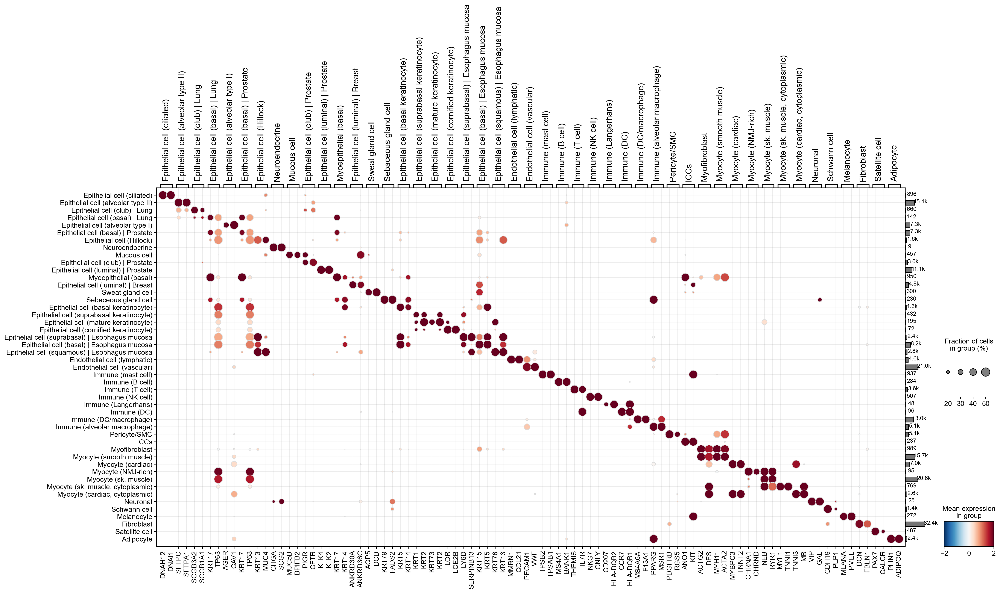

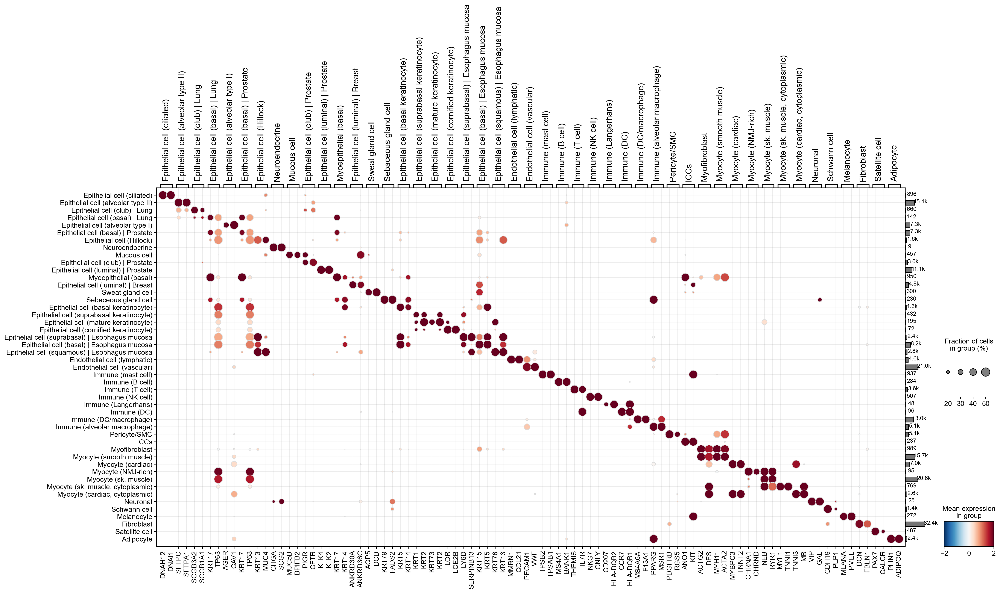

In [14]:
markers = {
    'Adipocyte': ['PLIN1', 'ADIPOQ'], 
    'Endothelial cell (lymphatic)': ['MMRN1', 'CCL21', ],
    'Endothelial cell (vascular)': ['PECAM1', 'VWF'], 
    'Epithelial cell (Hillock)': ['KRT13', 'MUC4'],
    'Epithelial cell (alveolar type I)': ['AGER', 'CAV1',],
    'Epithelial cell (alveolar type II)': ['SFTPC', 'SFTPA1'],
    'Epithelial cell (basal keratinocyte)': ['KRT5', 'KRT14'], 
    'Epithelial cell (basal) | Esophagus mucosa': ['KRT15', 'KRT5'],
    'Epithelial cell (basal) | Lung': ['KRT17', 'TP63'], 
    'Epithelial cell (basal) | Prostate': ['KRT17', 'TP63'],
    'Epithelial cell (ciliated)': ['DNAH12', 'DNAI1'], 
    'Epithelial cell (club) | Lung': ['SCGB3A2', 'SCGB1A1', ],
    'Epithelial cell (club) | Prostate': ['PIGR', 'CFTR',],
    'Epithelial cell (cornified keratinocyte)': ['LOR', 'LCE2B'], 
    'Epithelial cell (luminal) | Breast': ['ANKRD30A', 'ANKRD36C'],
    'Epithelial cell (luminal) | Prostate': ['KLK4', 'KLK2'],
    'Epithelial cell (mature keratinocyte)': ['KRT73', 'KRT2'],
    'Epithelial cell (squamous) | Esophagus mucosa': ['KRT78', 'KRT13'],
    'Epithelial cell (suprabasal keratinocyte)': ['KRT1', 'KRT2'],
    'Epithelial cell (suprabasal) | Esophagus mucosa': ['LY6D', 'SERPINB13',],
    'Fibroblast': ['DCN', 'FBLN1'], 
    'ICCs': ['ANO1', 'KIT',], 
    'Immune (B cell)': ['MS4A1', 'BANK1'],
    'Immune (DC)': ['CCR7', 'HLA-DQB1'],
    'Immune (DC/macrophage)': ['MS4A6A', 'F13A1'],
    'Immune (Langerhans)': ['CD207', 'HLA-DQB2'],
    'Immune (NK cell)': ['NKG7', 'GNLY'],
    'Immune (T cell)': ['THEMIS', 'IL7R'], 
    'Immune (alveolar macrophage)': ['PPARG', 'MSR1'],
    'Immune (mast cell)': ['TPSB2', 'TPSAB1'], 
    'Melanocyte': ['MLANA', 'PMEL'],
    'Mucous cell': ['MUC5B', 'BPIFB2'],
    'Myocyte (NMJ-rich)': ['CHRNA1', 'CHRND'],
    'Myocyte (cardiac)': ['MYBPC3', 'TNNT2',], 
    'Myocyte (cardiac, cytoplasmic)': ['TNNI3', 'MB'],    
    'Myocyte (sk. muscle)': ['NEB', 'RYR1'],
    'Myocyte (sk. muscle, cytoplasmic)': ['MYL1', 'TNNI1'],
    'Myocyte (smooth muscle)': ['MYH11', 'ACTA2'],
    'Myoepithelial (basal)': ['KRT17', 'KRT14'], 
    'Myofibroblast': ['ACTG2', 'DES'], 
    'Neuroendocrine': ['CHGA', 'SCG2'],
    'Neuronal': ['VIP', 'GAL'], 
    'Pericyte/SMC': ['PDGFRB', 'RGS5'],
    'Satellite cell': ['PAX7', 'CALCR'],
    'Schwann cell': ['CDH19', 'PLP1'],
    'Sebaceous gland cell': ['KRT79', 'FADS2'],
    'Sweat gland cell': ['AQP5', 'DCD'],
}

sc.tl.dendrogram(ad, 'Broad cell type splittissue', cor_method='pearson', optimal_ordering=True)

g = sc.pl.dotplot(ad, 
                  var_names=markers,
                  layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', groupby='Broad cell type splittissue', return_fig=True, dendrogram=True, figsize=(25,11), show=False);
g.add_totals(color='#757575')
g.style(cmap='RdBu_r', dot_edge_color='#DDDDDD', dot_edge_lw=1, dot_min=.1, dot_max=.5, grid=True)
g.savefig('figures/supplement-pertissue/tissue-ALL-dotplot.pdf');
g.show()

## Smaller panel

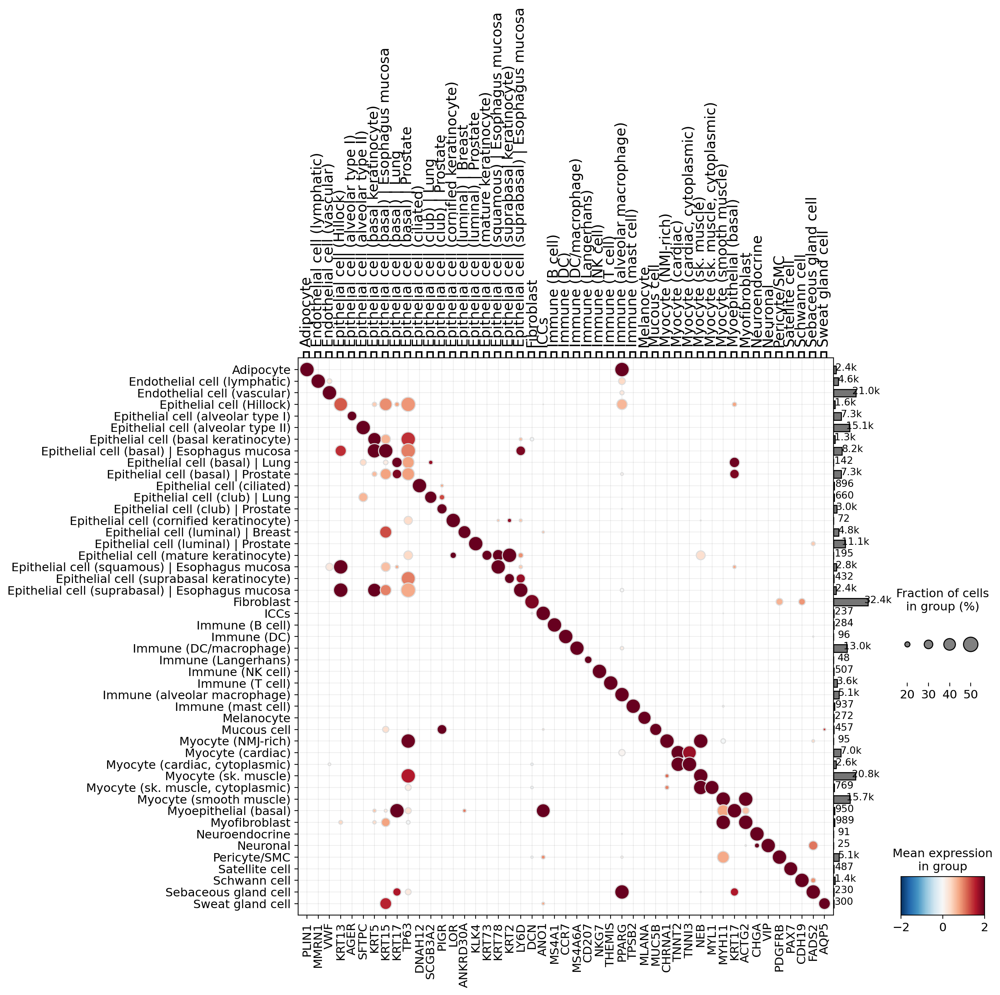

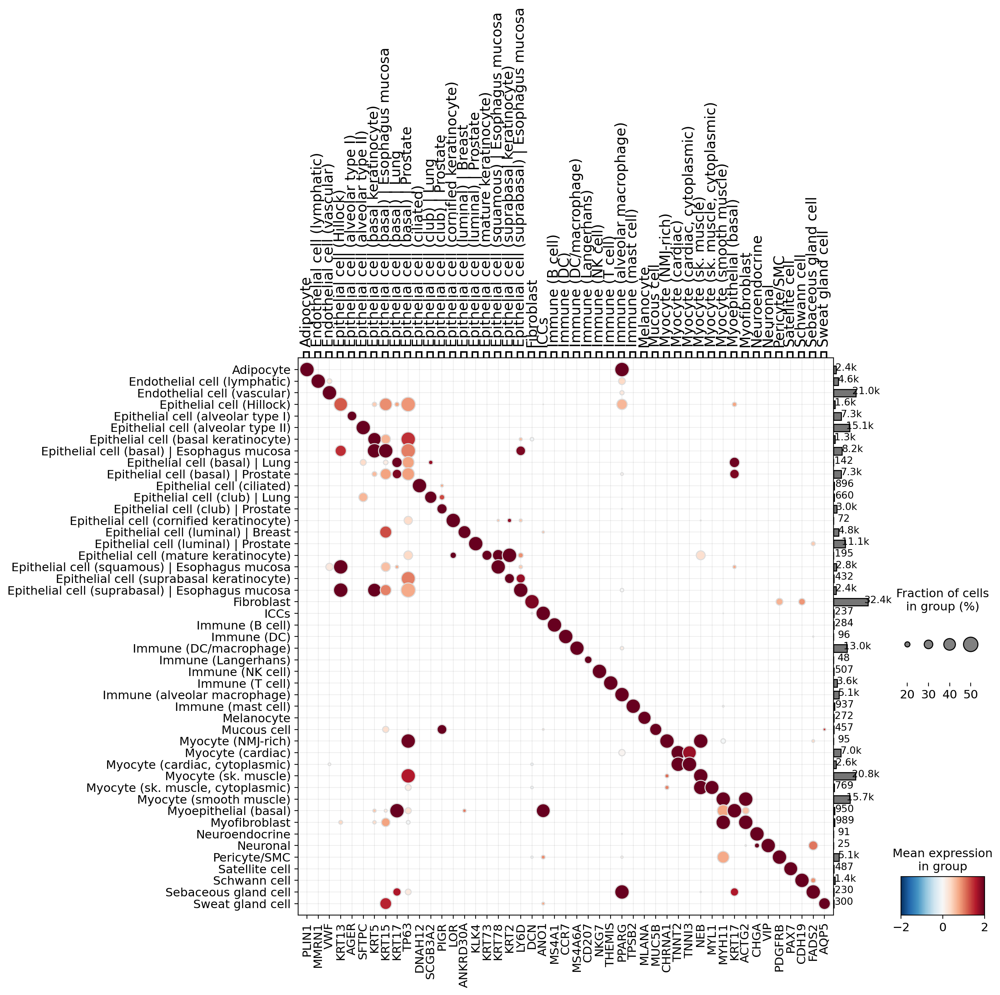

In [17]:
markers = {
    'Adipocyte': ['PLIN1'], 
    'Endothelial cell (lymphatic)': ['MMRN1', ],
    'Endothelial cell (vascular)': ['VWF'], 
    'Epithelial cell (Hillock)': ['KRT13'],
    'Epithelial cell (alveolar type I)': ['AGER',],
    'Epithelial cell (alveolar type II)': ['SFTPC'],
    'Epithelial cell (basal keratinocyte)': ['KRT5'], 
    'Epithelial cell (basal) | Esophagus mucosa': ['KRT15'],
    'Epithelial cell (basal) | Lung': ['KRT17'], 
    'Epithelial cell (basal) | Prostate': ['TP63'],
    'Epithelial cell (ciliated)': ['DNAH12'], 
    'Epithelial cell (club) | Lung': ['SCGB3A2', ],
    'Epithelial cell (club) | Prostate': ['PIGR',],
    'Epithelial cell (cornified keratinocyte)': ['LOR'], 
    'Epithelial cell (luminal) | Breast': ['ANKRD30A'],
    'Epithelial cell (luminal) | Prostate': ['KLK4'],
    'Epithelial cell (mature keratinocyte)': ['KRT73'],
    'Epithelial cell (squamous) | Esophagus mucosa': ['KRT78'],
    'Epithelial cell (suprabasal keratinocyte)': ['KRT2'],
    'Epithelial cell (suprabasal) | Esophagus mucosa': ['LY6D',],
    'Fibroblast': ['DCN', ], 
    'ICCs': ['ANO1',], 
    'Immune (B cell)': ['MS4A1'],
    'Immune (DC)': ['CCR7'],
    'Immune (DC/macrophage)': ['MS4A6A'],
    'Immune (Langerhans)': ['CD207'],
    'Immune (NK cell)': ['NKG7'],
    'Immune (T cell)': ['THEMIS'], 
    'Immune (alveolar macrophage)': ['PPARG'],
    'Immune (mast cell)': ['TPSB2'], 
    'Melanocyte': ['MLANA'],
    'Mucous cell': ['MUC5B'],
    'Myocyte (NMJ-rich)': ['CHRNA1'],    
    'Myocyte (cardiac)': ['TNNT2',], 
    'Myocyte (cardiac, cytoplasmic)': ['TNNI3'],    
    'Myocyte (sk. muscle)': ['NEB'],
    'Myocyte (sk. muscle, cytoplasmic)': ['MYL1'],
    'Myocyte (smooth muscle)': ['MYH11'],
    'Myoepithelial (basal)': ['KRT17'], 
    'Myofibroblast': ['ACTG2'], 
    'Neuroendocrine': ['CHGA'],
    'Neuronal': ['VIP'], 
    'Pericyte/SMC': ['PDGFRB'],
    'Satellite cell': ['PAX7'],
    'Schwann cell': ['CDH19'],
    'Sebaceous gland cell': ['FADS2'],
    'Sweat gland cell': ['AQP5'],
}

sc.tl.dendrogram(ad, 'Broad cell type splittissue', cor_method='pearson', optimal_ordering=True)

g = sc.pl.dotplot(ad, 
                  var_names=markers,
                  layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', groupby='Broad cell type splittissue', return_fig=True, dendrogram=False, figsize=(12,10), show=False);
g.add_totals(color='#757575')
g.style(cmap='RdBu_r', dot_edge_color='#DDDDDD', dot_edge_lw=1, dot_min=.1, dot_max=.5, grid=True)
g.savefig('figures/supplement-pertissue/tissue-ALL-narrow-dotplot.pdf');
g.show()

f = sc.pl.dotplot(adata, 'MALAT1', groupby='tissue', return_fig=True, figsize=(12,4), save='tissue-barplots.pdf')
f.add_totals(color='#CCCCCC', size=0.9)
f.savefig('figures/supplement-pertissue/tissue-barplots.pdf');

In [113]:
df = run_spring(ad, 'Broad cell type splittissue')

  0%|          | 0/47 [00:00<?, ?it/s]

In [ ]:
dotplot_spring(ad, 'Broad cell type splittissue', n_genes=10, layer='scaled', vmin=-2, vmax=2, return_fig=True).style(cmap='RdBu_r', grid=True, dot_max=.5).show()

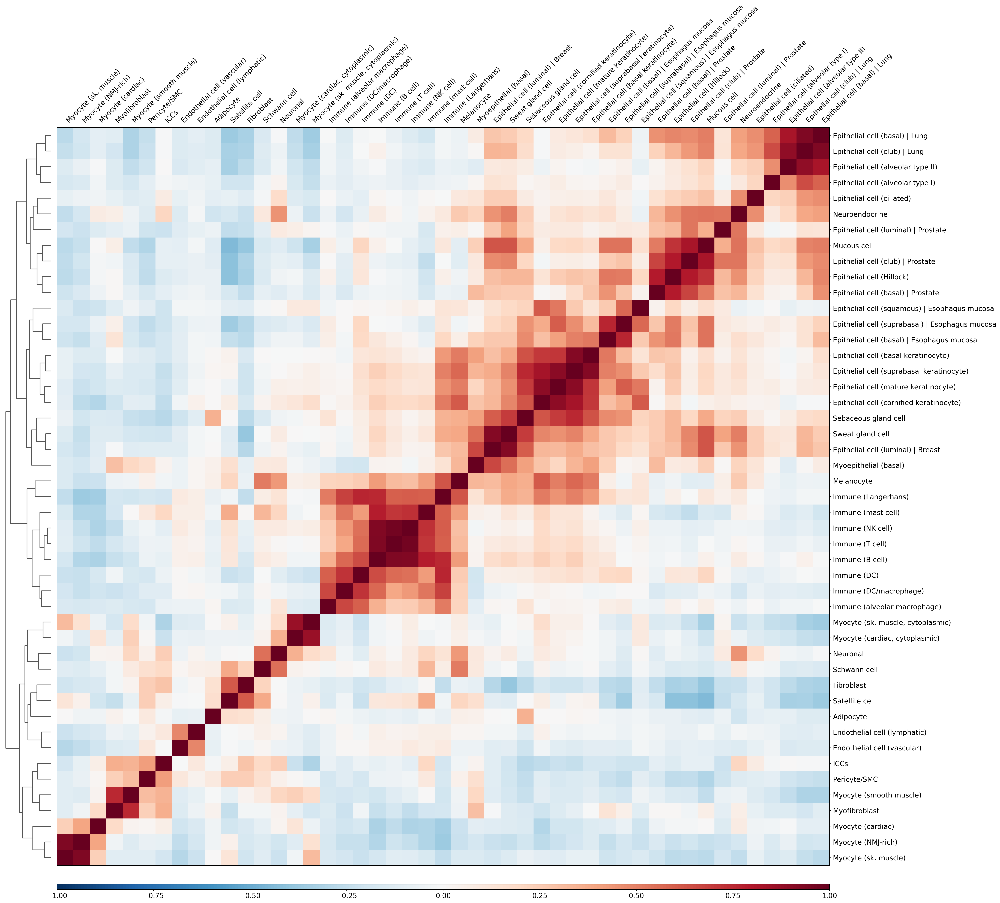

In [19]:
sc.pl.correlation_matrix(ad, 'Broad cell type splittissue', cmap='RdBu_r')

## Markers and UMAPs

### Breast

In [66]:
sc.set_figure_params(dpi=100, vector_friendly=False)

In [67]:
ad = adata[adata.obs.Tissue == 'Breast'].copy()
ad.layers['scaled'] = ad.X.copy()
sc.pp.scale(ad, max_value=10, layer='scaled')
ad

AnnData object with n_obs × n_vars = 9770 × 17695
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'Participant ID', 'Container', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Age', 'BMI', 'Race/Ethnicity', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'batch_triplet', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'batch-barcode', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'Tissue', 'channel', 'ischemic_time', 'Participant_ID', 'Sample_ID'
    var: 'gene_ids', 'Chromosome', 'Source', 'Start', 'End', 'St

In [68]:
del ad.uns['Granular cell type_colors']

In [ ]:
fig = umap_adj_text(ad, 'Granular cell type', 'umap_tissue', size=10)
fig

In [70]:
#fig.savefig(sc.settings.figdir / 'tissue-breast-umap-celltypes.png', dpi=300)
fig.savefig(sc.settings.figdir / 'tissue-breast-umap-celltypes.pdf', dpi=300)

In [21]:
df = run_spring(ad, 'Granular cell type')
#dotplot_spring(ad, 'Granular cell type', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r')

  0%|          | 0/14 [00:00<?, ?it/s]

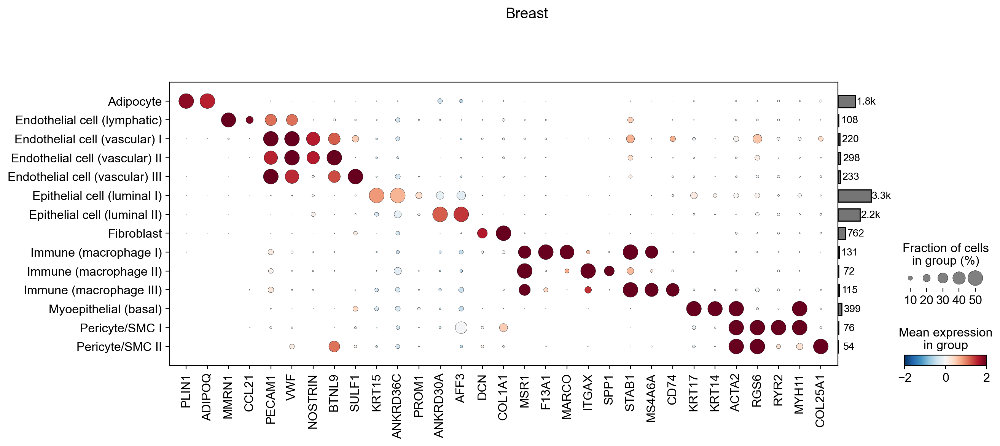

In [22]:
genes = ['PLIN1', 'ADIPOQ', 'MMRN1', 'CCL21', 'PECAM1', 'VWF', 'NOSTRIN', 'BTNL9', 'SULF1',
         'KRT15', 'ANKRD36C', 'PROM1', 'ANKRD30A', 'AFF3', 
         'DCN', 'COL1A1',
         'MSR1', 'F13A1', 'MARCO', 'ITGAX', 'SPP1', 'STAB1', 'MS4A6A', 'CD74',
         'KRT17', 'KRT14', 
         'ACTA2', 'RGS6', 'RYR2', 'MYH11', 'COL25A1',
]

g = sc.pl.dotplot(ad, 
                  var_names=genes,
                  layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', groupby='Granular cell type', title='Breast', dot_max=.5, return_fig=True)
g.add_totals(color='#757575')
g.savefig('figures/supplement-pertissue/tissue-breast-dotplot.pdf');

### E. mucosa

In [23]:
ad = adata[adata.obs.Tissue == 'Esophagus mucosa'].copy()
ad.layers['scaled'] = ad.X.copy()
sc.pp.scale(ad, max_value=10, layer='scaled')
ad

AnnData object with n_obs × n_vars = 26060 × 17695
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'Participant ID', 'Container', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Age', 'BMI', 'Race/Ethnicity', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'batch_triplet', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'batch-barcode', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'Tissue', 'channel', 'ischemic_time', 'Participant_ID', 'Sample_ID'
    var: 'gene_ids', 'Chromosome', 'Source', 'Start', 'End', 'S

In [24]:
del ad.uns['Granular cell type_colors']

In [ ]:
fig = umap_adj_text(ad, 'Granular cell type', 'umap_tissue', size=10, add_outline=False)

In [26]:
#fig.savefig(sc.settings.figdir / 'tissue-emucosa-umap-celltypes.png', dpi=300)
fig.savefig(sc.settings.figdir / 'tissue-emucosa-umap-celltypes.pdf', dpi=300)

In [27]:
#df = run_spring(ad, 'Granular cell type')
#dotplot_spring(ad, 'Granular cell type', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r')

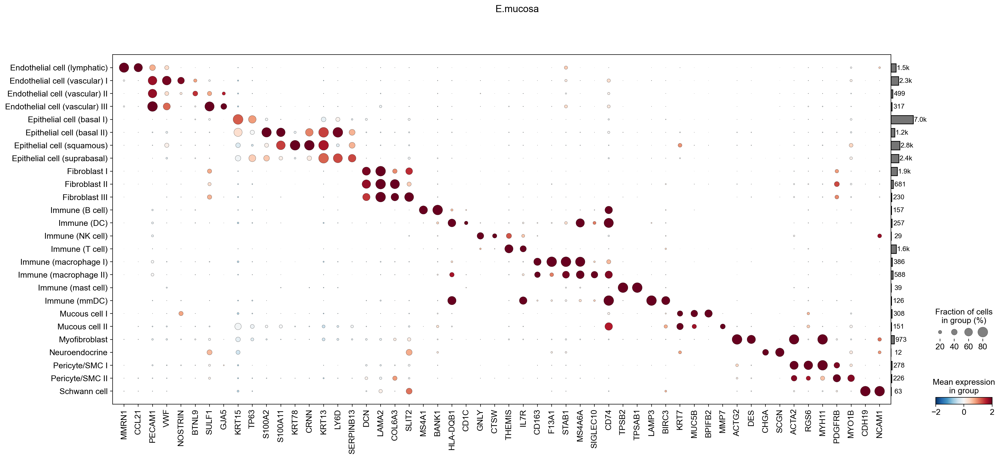

In [28]:
genes = ['MMRN1', 'CCL21', 'PECAM1', 'VWF', 'NOSTRIN', 'BTNL9', 'SULF1', 'GJA5',
         'KRT15', 'TP63', 'S100A2', 'S100A11', 'KRT78', 'CRNN', 'KRT13', 'LY6D', 'SERPINB13',
         'DCN', 'LAMA2', 'COL6A3', 'SLIT2',
         'MS4A1', 'BANK1', 'HLA-DQB1', 'CD1C', 'GNLY', 'CTSW', 'THEMIS', 'IL7R',
         'CD163', 'F13A1', 'STAB1', 'MS4A6A', 'SIGLEC10', 'CD74',
         'TPSB2', 'TPSAB1', 'LAMP3', 'BIRC3',
         'KRT7', 'MUC5B', 'BPIFB2', 'MMP7',
         'ACTG2', 'DES', 'CHGA', 'SCGN',
         'ACTA2', 'RGS6', 'MYH11', 'PDGFRB', 'MYO1B',
         'CDH19', 'NCAM1',
]

g = sc.pl.dotplot(ad, 
                  var_names=genes,
                  layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', groupby='Granular cell type', title='E.mucosa', dot_max=.8, return_fig=True)
g.add_totals(color='#757575')
g.savefig('figures/supplement-pertissue/tissue-emucosa-dotplot.pdf');

### E. muscularis

In [29]:
ad = adata[adata.obs.Tissue == 'Esophagus muscularis'].copy()
ad.layers['scaled'] = ad.X.copy()
sc.pp.scale(ad, max_value=10, layer='scaled')
ad

AnnData object with n_obs × n_vars = 34173 × 17695
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'Participant ID', 'Container', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Age', 'BMI', 'Race/Ethnicity', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'batch_triplet', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'batch-barcode', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'Tissue', 'channel', 'ischemic_time', 'Participant_ID', 'Sample_ID'
    var: 'gene_ids', 'Chromosome', 'Source', 'Start', 'End', 'S

In [30]:
del ad.uns['Granular cell type_colors']

In [ ]:
fig = umap_adj_text(ad, 'Granular cell type', 'umap_tissue', size=10, add_outline=False)

In [32]:
#fig.savefig(sc.settings.figdir / 'tissue-emuscularis-umap-celltypes.png', dpi=300)
fig.savefig(sc.settings.figdir / 'tissue-emuscularis-umap-celltypes.pdf', dpi=300)

In [33]:
#df = run_spring(ad, 'Granular cell type')
#dotplot_spring(ad, 'Granular cell type', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r')

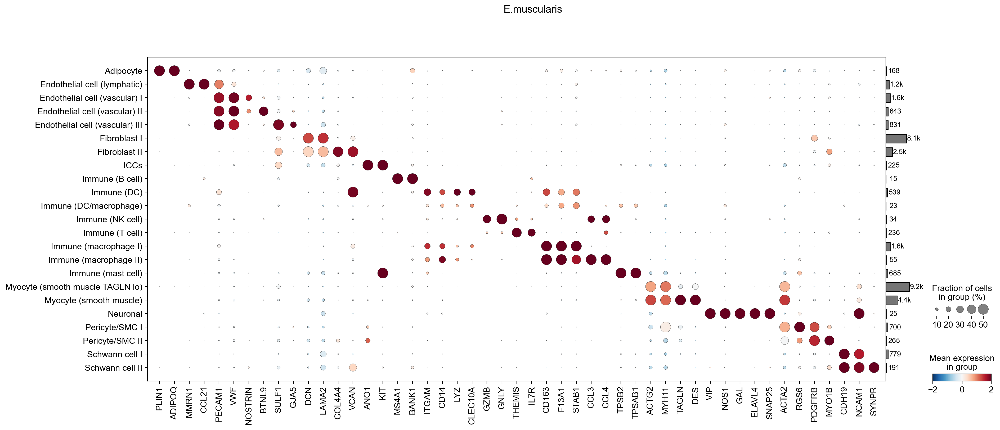

In [34]:
genes = [
    'PLIN1', 'ADIPOQ',
    'MMRN1', 'CCL21', 'PECAM1', 'VWF', 'NOSTRIN', 'BTNL9', 'SULF1', 'GJA5',
    'DCN', 'LAMA2', 'COL4A4', 'VCAN',
    'ANO1', 'KIT',
    'MS4A1', 'BANK1', 'ITGAM', 'CD14', 'LYZ', 'CLEC10A',
    'GZMB', 'GNLY', 'THEMIS', 'IL7R',
    'CD163', 'F13A1', 'STAB1', 'CCL3', 'CCL4', 
    'TPSB2', 'TPSAB1', 
    'ACTG2', 'MYH11', 'TAGLN', 'DES',
    'VIP', 'NOS1', 'GAL', 'ELAVL4', 'SNAP25',
    'ACTA2', 'RGS6', 'PDGFRB', 'MYO1B',
    'CDH19', 'NCAM1', 'SYNPR'
]

g = sc.pl.dotplot(ad, 
                  var_names=genes,
                  layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', groupby='Granular cell type', title='E.muscularis', dot_max=.5, return_fig=True)
g.add_totals(color='#757575')
g.savefig('figures/supplement-pertissue/tissue-emuscularis-dotplot.pdf');

### Heart

In [35]:
ad = adata[adata.obs.Tissue == 'Heart'].copy()
ad.layers['scaled'] = ad.X.copy()
sc.pp.scale(ad, max_value=10, layer='scaled')
ad

AnnData object with n_obs × n_vars = 36574 × 17695
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'Participant ID', 'Container', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Age', 'BMI', 'Race/Ethnicity', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'batch_triplet', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'batch-barcode', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'Tissue', 'channel', 'ischemic_time', 'Participant_ID', 'Sample_ID'
    var: 'gene_ids', 'Chromosome', 'Source', 'Start', 'End', 'S

In [36]:
del ad.uns['Granular cell type_colors']

In [ ]:
fig = umap_adj_text(ad, 'Granular cell type', 'umap_tissue', size=10, add_outline=False)

In [38]:
#fig.savefig(sc.settings.figdir / 'tissue-heart-umap-celltypes.png', dpi=300)
fig.savefig(sc.settings.figdir / 'tissue-heart-umap-celltypes.pdf', dpi=300)

In [39]:
#df = run_spring(ad, 'Granular cell type')
#dotplot_spring(ad, 'Granular cell type', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r')

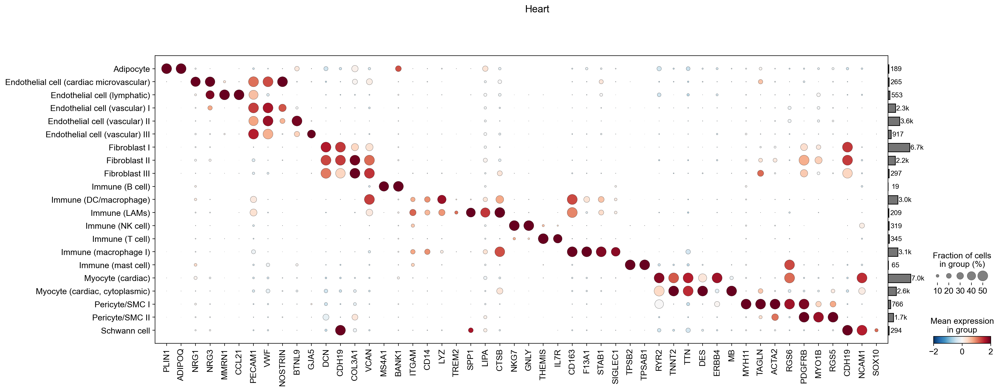

In [40]:
genes = [
    'PLIN1', 'ADIPOQ',
    'NRG1', 'NRG3',
    'MMRN1', 'CCL21', 
    'PECAM1', 'VWF', 
    'NOSTRIN', 'BTNL9', 'GJA5',
    'DCN', 'CDH19', 'COL3A1', 'VCAN',
    'MS4A1', 'BANK1', 
    'ITGAM', 'CD14', 'LYZ',
    'TREM2', 'SPP1', 'LIPA', 'CTSB', 
    'NKG7', 'GNLY', 'THEMIS', 'IL7R',
    'CD163', 'F13A1', 'STAB1', 'SIGLEC1', 
    'TPSB2', 'TPSAB1', 
    'RYR2', 'TNNT2', 'TTN', 'DES', 'ERBB4', 'MB',
    'MYH11', 'TAGLN',
    'ACTA2', 'RGS6', 'PDGFRB', 'MYO1B', 'RGS5',
    'CDH19', 'NCAM1', 'SOX10',
]

g = sc.pl.dotplot(ad, 
                  var_names=genes,
                  layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', groupby='Granular cell type', title='Heart', dot_max=.5, return_fig=True)
g.add_totals(color='#757575')
g.savefig('figures/supplement-pertissue/tissue-heart-dotplot.pdf');

### Lung

In [41]:
ad = adata[adata.obs.Tissue == 'Lung'].copy()
ad.layers['scaled'] = ad.X.copy()
sc.pp.scale(ad, max_value=10, layer='scaled')
ad

AnnData object with n_obs × n_vars = 35284 × 17695
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'Participant ID', 'Container', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Age', 'BMI', 'Race/Ethnicity', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'batch_triplet', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'batch-barcode', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'Tissue', 'channel', 'ischemic_time', 'Participant_ID', 'Sample_ID'
    var: 'gene_ids', 'Chromosome', 'Source', 'Start', 'End', 'S

In [42]:
del ad.uns['Granular cell type_colors']

In [ ]:
fig = umap_adj_text(ad, 'Granular cell type', 'umap_tissue', size=10, add_outline=False)

In [44]:
#fig.savefig(sc.settings.figdir / 'tissue-lung-umap-celltypes.png', dpi=300)
fig.savefig(sc.settings.figdir / 'tissue-lung-umap-celltypes.pdf', dpi=300)

In [45]:
#df = run_spring(ad, 'Granular cell type')
#dotplot_spring(ad, 'Granular cell type', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r')

In [46]:
#df[df.group == 'Epithelial cell (ciliated)'].head(30)

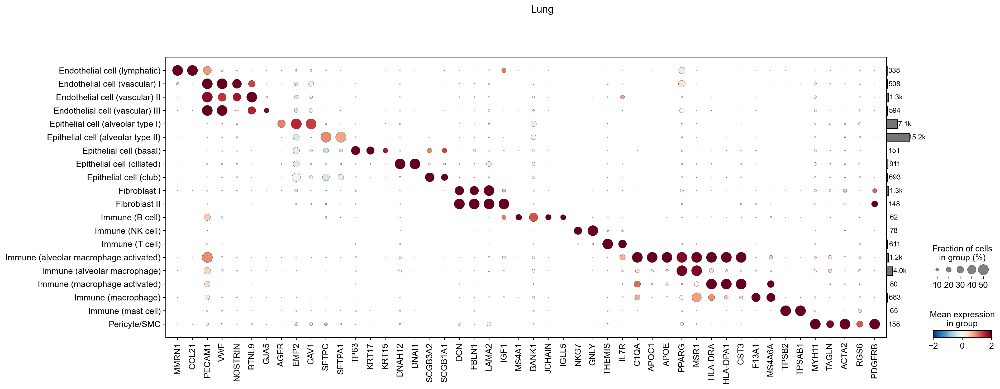

In [47]:
genes = [
    'MMRN1', 'CCL21', 'PECAM1', 'VWF', 'NOSTRIN', 'BTNL9', 'GJA5',
    'AGER', 'EMP2', 'CAV1',
    'SFTPC', 'SFTPA1',
    'TP63', 'KRT17', 'KRT15',
    'DNAH12', 'DNAI1', 'SCGB3A2', 'SCGB1A1',
    'DCN', 'FBLN1', 'LAMA2', 'IGF1',
    'MS4A1', 'BANK1', 'JCHAIN', 'IGLL5',
    'NKG7', 'GNLY', 'THEMIS', 'IL7R',
    'C1QA', 'APOC1',  'APOE', 
    'PPARG', 'MSR1', 'HLA-DRA', 'HLA-DPA1', 'CST3',
    'F13A1', 'MS4A6A',
    'TPSB2', 'TPSAB1', 
    'MYH11', 'TAGLN',
    'ACTA2', 'RGS6', 'PDGFRB',
]

g = sc.pl.dotplot(ad, 
                  var_names=genes,
                  layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', groupby='Granular cell type', title='Lung', dot_max=.5, return_fig=True)
g.add_totals(color='#757575')
g.savefig('figures/supplement-pertissue/tissue-lung-dotplot.pdf');

### Prostate

In [48]:
ad = adata[adata.obs.Tissue == 'Prostate'].copy()
ad.layers['scaled'] = ad.X.copy()
sc.pp.scale(ad, max_value=10, layer='scaled')
ad

AnnData object with n_obs × n_vars = 31061 × 17695
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'Participant ID', 'Container', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Age', 'BMI', 'Race/Ethnicity', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'batch_triplet', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'batch-barcode', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'Tissue', 'channel', 'ischemic_time', 'Participant_ID', 'Sample_ID'
    var: 'gene_ids', 'Chromosome', 'Source', 'Start', 'End', 'S

In [49]:
del ad.uns['Granular cell type_colors']

In [ ]:
fig = umap_adj_text(ad, 'Granular cell type', 'umap_tissue', size=10, add_outline=False)

In [51]:
#fig.savefig(sc.settings.figdir / 'tissue-prostate-umap-celltypes.png', dpi=300)
fig.savefig(sc.settings.figdir / 'tissue-prostate-umap-celltypes.pdf', dpi=300)

In [52]:
#df = run_spring(ad, 'Granular cell type')
#dotplot_spring(ad, 'Granular cell type', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r')

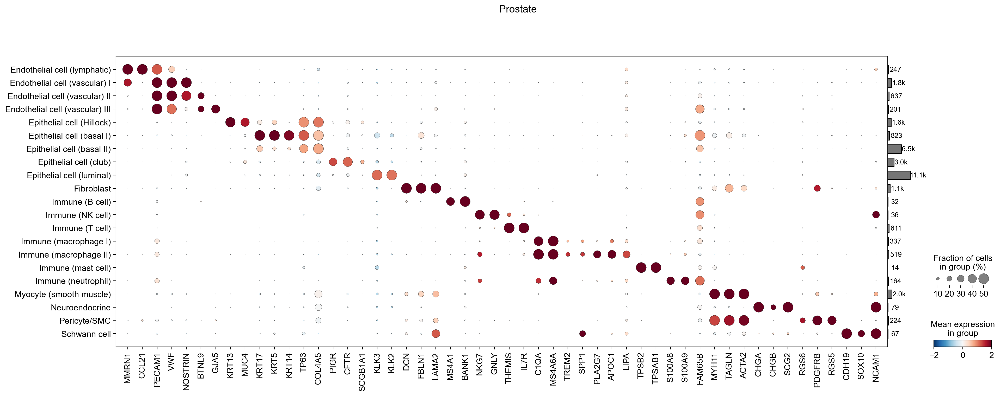

In [53]:
genes = [
    'MMRN1', 'CCL21', 'PECAM1', 'VWF', 'NOSTRIN', 'BTNL9', 'GJA5',
    'KRT13', 'MUC4',
    'KRT17', 'KRT5', 'KRT14', 'TP63', 'COL4A5',
    'PIGR', 'CFTR', 'SCGB1A1', 'KLK3', 'KLK2',
    'DCN', 'FBLN1', 'LAMA2',
    'MS4A1', 'BANK1',
    'NKG7', 'GNLY', 'THEMIS', 'IL7R',
    'C1QA', 'MS4A6A',
    'TREM2', 'SPP1', 'PLA2G7', 'APOC1', 'LIPA',    
    'TPSB2', 'TPSAB1', 
    'S100A8', 'S100A9', 'FAM65B',
    'MYH11', 'TAGLN', 'ACTA2',
    'CHGA', 'CHGB', 'SCG2',
    'RGS6', 'PDGFRB', 'RGS5',
    'CDH19', 'SOX10', 'NCAM1',
]

g = sc.pl.dotplot(ad, 
                  var_names=genes,
                  layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', groupby='Granular cell type', title='Prostate', dot_max=.5, return_fig=True)
g.add_totals(color='#757575')
g.savefig('figures/supplement-pertissue/tissue-prostate-dotplot.pdf');

### Sk muscle

In [54]:
ad = adata[adata.obs.Tissue == 'Skeletal muscle'].copy()
ad.layers['scaled'] = ad.X.copy()
sc.pp.scale(ad, max_value=10, layer='scaled')
ad

AnnData object with n_obs × n_vars = 30877 × 17695
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'Participant ID', 'Container', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Age', 'BMI', 'Race/Ethnicity', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'batch_triplet', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'batch-barcode', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'Tissue', 'channel', 'ischemic_time', 'Participant_ID', 'Sample_ID'
    var: 'gene_ids', 'Chromosome', 'Source', 'Start', 'End', 'S

In [55]:
del ad.uns['Granular cell type_colors']

In [ ]:
fig = umap_adj_text(ad, 'Granular cell type', 'umap_tissue', size=10, add_outline=False)

In [57]:
#fig.savefig(sc.settings.figdir / 'tissue-skmuscle-umap-celltypes.png', dpi=300)
fig.savefig(sc.settings.figdir / 'tissue-skmuscle-umap-celltypes.pdf', dpi=300)

In [58]:
#df = run_spring(ad, 'Granular cell type')
#dotplot_spring(ad, 'Granular cell type', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r')

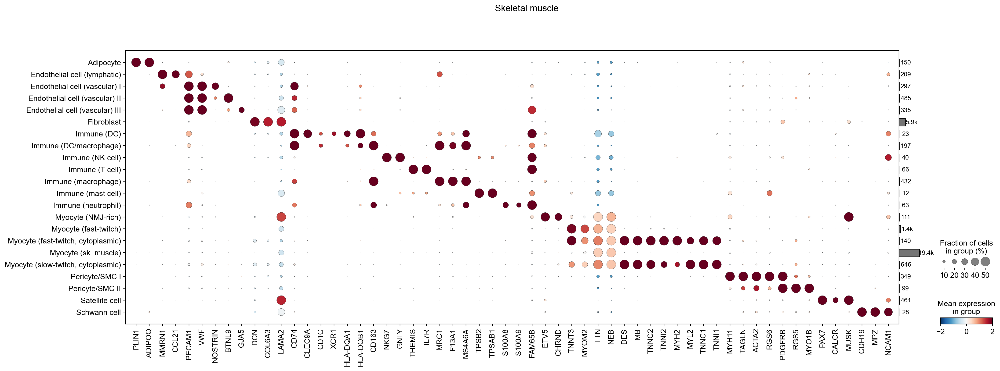

In [59]:
genes = [
    'PLIN1', 'ADIPOQ',
    'MMRN1', 'CCL21', 'PECAM1', 'VWF', 'NOSTRIN', 'BTNL9', 'GJA5',
    'DCN', 'COL6A3', 'LAMA2',
    'CD74', 'CLEC9A', 'CD1C', 'XCR1',
    'HLA-DQA1', 'HLA-DQB1', 'CD163',
    'NKG7', 'GNLY', 'THEMIS', 'IL7R',
    'MRC1', 'F13A1', 'MS4A6A',
    'TPSB2', 'TPSAB1', 
    'S100A8', 'S100A9', 'FAM65B',
    'ETV5', 'CHRND',    
    'TNNT3', 'MYOM2',    
    'TTN', 'NEB', 'DES', 'MB',
    'TNNC2', 'TNNI2', 'MYH2', 'MYL2', 'TNNC1', 'TNNI1', 
    'MYH11', 'TAGLN', 'ACTA2',
    'RGS6', 'PDGFRB', 'RGS5', 'MYO1B',
    'PAX7', 'CALCR', 'MUSK',
    'CDH19', 'MPZ', 'NCAM1'
]

g = sc.pl.dotplot(ad, 
                  var_names=genes,
                  layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', groupby='Granular cell type', title='Skeletal muscle', dot_max=.5, return_fig=True)
g.add_totals(color='#757575')
g.savefig('figures/supplement-pertissue/tissue-skmuscle-dotplot.pdf');

### Skin

In [71]:
ad = adata[adata.obs.Tissue == 'Skin'].copy()
ad.layers['scaled'] = ad.X.copy()
sc.pp.scale(ad, max_value=10, layer='scaled')
ad

AnnData object with n_obs × n_vars = 5327 × 17695
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'Participant ID', 'Container', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Age', 'BMI', 'Race/Ethnicity', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'batch_triplet', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'batch-barcode', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'Tissue', 'channel', 'ischemic_time', 'Participant_ID', 'Sample_ID'
    var: 'gene_ids', 'Chromosome', 'Source', 'Start', 'End', 'St

In [72]:
del ad.uns['Granular cell type_colors']

In [ ]:
fig = umap_adj_text(ad, 'Granular cell type', 'umap_tissue', size=10, add_outline=False)

In [74]:
#fig.savefig(sc.settings.figdir / 'tissue-skin-umap-celltypes.png', dpi=300)
fig.savefig(sc.settings.figdir / 'tissue-skin-umap-celltypes.pdf', dpi=300)

In [64]:
#df = run_spring(ad, 'Granular cell type')
#dotplot_spring(ad, 'Granular cell type', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r')

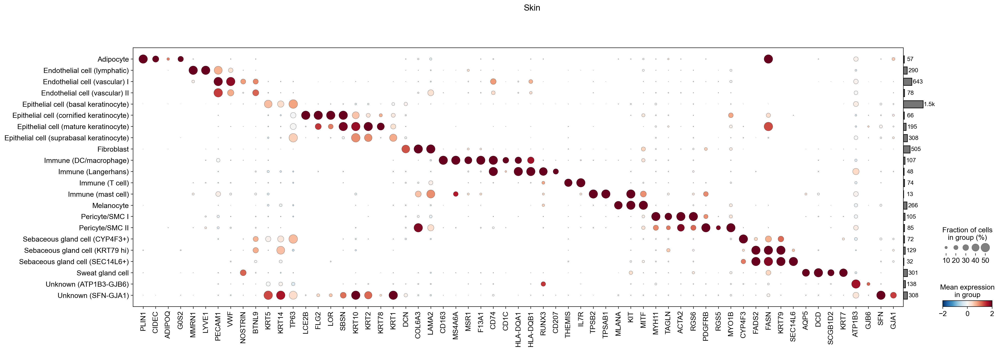

In [65]:
genes = [
    'PLIN1', 'CIDEC', 'ADIPOQ', 'G0S2',
    'MMRN1', 'LYVE1', 'PECAM1', 'VWF', 'NOSTRIN', 'BTNL9',
    'KRT5', 'KRT14', 'TP63', 'LCE2B', 'FLG2', 'LOR', 'SBSN', 'KRT10', 'KRT2', 'KRT78', 'KRT1',
    'DCN', 'COL6A3', 'LAMA2',
    'CD163', 'MS4A6A', 'MSR1', 'F13A1', 'CD74', 'CD1C',
    'HLA-DQA1', 'HLA-DQB1', 'RUNX3', 'CD207',
    'THEMIS', 'IL7R',
    'TPSB2', 'TPSAB1', 'MLANA', 'KIT', 'MITF',
    'MYH11', 'TAGLN', 'ACTA2',
    'RGS6', 'PDGFRB', 'RGS5', 'MYO1B',
    'CYP4F3', 'FADS2', 'FASN', 'KRT79', 'SEC14L6',
    'AQP5', 'DCD', 'SCGB1D2', 'KRT7',
    'ATP1B3', 'GJB6', 'SFN', 'GJA1'
]

g = sc.pl.dotplot(ad, 
                  var_names=genes,
                  layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', groupby='Granular cell type', title='Skin', dot_max=.5, return_fig=True)
g.add_totals(color='#757575')
g.savefig('figures/supplement-pertissue/tissue-skin-dotplot.pdf');